In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# data url = https://www.kaggle.com/datasets/karlorusovan/league-of-legends-soloq-matches-at-10-minutes-2024

In [2]:
df = pd.read_csv('./match_data_v5.csv')
df.head()

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29
0,EUW1_6882489515',2,23,4,2,0,0,0,7,0,...,2,0,1,400,94,29637,32613,27239,1,0
1,EUW1_6882416210',2,46,12,1,0,1,0,10,0,...,1,0,4,373,76,28970,30320,36585,0,0
2,EUW1_6881092720',2,19,13,0,0,0,0,11,0,...,2,0,3,340,84,30510,29464,42984,0,0
3,EUW1_6879405717',3,28,8,0,1,1,0,9,1,...,0,0,5,378,87,25157,31069,28229,0,0
4,EUW1_6879389461',3,30,11,1,1,1,0,7,0,...,1,0,5,382,96,26052,29475,19245,1,0


In [3]:
df = df.drop('Unnamed: 29', axis=1)
df

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28
0,EUW1_6882489515',2,23,4,2,0,0,0,7,0,...,0,2,0,1,400,94,29637,32613,27239,1
1,EUW1_6882416210',2,46,12,1,0,1,0,10,0,...,0,1,0,4,373,76,28970,30320,36585,0
2,EUW1_6881092720',2,19,13,0,0,0,0,11,0,...,0,2,0,3,340,84,30510,29464,42984,0
3,EUW1_6879405717',3,28,8,0,1,1,0,9,1,...,0,0,0,5,378,87,25157,31069,28229,0
4,EUW1_6879389461',3,30,11,1,1,1,0,7,0,...,0,1,0,5,382,96,26052,29475,19245,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24220,EUW1_6879062849',0,27,1,1,0,0,0,5,0,...,0,0,0,0,370,102,26134,30760,22845,0
24221,EUW1_6878994449',4,29,5,0,0,0,0,4,0,...,0,1,0,2,365,80,25169,30857,29694,0
24222,EUW1_6878933095',1,25,16,1,1,1,0,11,0,...,0,1,0,4,342,81,30528,29566,36545,0
24223,EUW1_6883217488',4,27,15,0,0,1,0,9,0,...,0,2,0,2,341,74,31761,30573,42858,0


In [4]:
df.shape

(24225, 29)

In [5]:
# 열의 이름 변경

# blueTeamControlWardsPlaced - 블루 팀이 배치한 제어/분홍색 와드(팀이 포기하고 마지막에 많은 와드를 구매하여 배치할 가능성에 따라 이상값이 있을 수 있음)
# blueTeamWardsPlaced - 블루 팀이 배치한 모든 유형의 와드(제어 와드, 노란색 장신구, 유령 포로 장신구 등..)
# blueTeamTotalKills - 블루 팀의 총 킬 수, 적 챔피언을 처치하면 골드와 경험치가 생성됩니다.
# blueTeamDragonKills - 블루 팀의 총 드래곤 킬 수, 드래곤은 죽을 때 특정 영구 버프를 제공하고 4번째 드래곤을 죽이면 팀 드래곤의 영혼을 제공하는 엘리트 몬스터입니다.
# blueTeamHeraldKills - 블루 팀의 총 전령 사살, 전령은 적의 건물(포탑, 억제기 및 넥서스)을 파괴하고 공격로를 밀어내는 데 도움을 주는 엘리트 몬스터입니다.
# blueTeamTowersDestroyed - 블루 팀에 의해 총 타워가 파괴되었습니다. 타워는 미니언과 챔피언을 대상으로 하는 레인의 방어 구조물입니다.
# blueTeamInhibitorsDestroyed - 블루 팀에 의해 총 억제제가 파괴되었습니다. 억제제는 타워로 보호되는 건물이며, 파괴되면 이를 파괴한 팀 측에 슈퍼 미니언이 생성될 수 있습니다.
# blueTeamTurretPlatesDestroyed - 블루 팀이 총 터렛/타워 플레이트를 파괴했습니다. 터렛 플레이트는 파괴 시 골드를 생성하고 14분에 완전히 떨어지는 타워의 보호막입니다.
# blueTeamFirstBlood - 1개의 블루 팀 퍼스트 블러드, 0개의 레드 팀 퍼스트 블러드; 첫 번째 혈액은 킬을 위해 추가 금을 생성합니다.
# blueTeamMinionsKilled - 블루 팀이 죽인 총 미니언, 미니언은 골드와 경험치를 생성하며 게임의 주요 수입원입니다.
# blueTeamJungleMinions - 블루팀이 죽인 총 정글 미니언도 골드를 생성하지만 경험치는 정글러만 얻습니다.
# blueTeamTotalGold - 블루팀이 다양한 소스(건물, 킬, 어시스트, 미니언 등)에서 획득한 총 골드
# blueTeamXp - 총 블루 팀 경험치, 라인에서 소비한 총 금액(경험치를 얻기 위해 챔피언에 의해 미니언을 죽일 필요는 없음) 및 죽인 총 챔피언 수와 관련이 있습니다.
# blueTeamTotalDamageToChamps - 블루팀이 적 챔피언에게 가한 총 피해량

# red팀에 대해서도 동일하게 만들어줌

# blueWin - 블루 팀 1승, 레드 팀 0승

cols = ['matchID', 
        'blueTeamControlWardsPlaced', 'blueTeamWardsPlaced',
        'blueTeamTotalKills', 'blueTeamDragonKills', 'blueTeamHeraldKills',
        'blueTeamTowersDestroyed', 'blueTeamInhibitorsDestroyed', 'blueTeamTurretPlatesDestroyed',
        'blueTeamFirstBlood', 'blueTeamMinionsKilled', 'blueTeamJungleMinions',
        'blueTeamTotalGold', 'blueTeamXp', 'blueTeamTotalDamageToChamps', 
        'redTeamControlWardsPlaced', 'redTeamWardsPlaced',
        'redTeamTotalKills', 'redTeamDragonKills', 'redTeamHeraldKills',
        'redTeamTowersDestroyed', 'redTeamInhibitorsDestroyed', 'redTeamTurretPlatesDestroyed',
        'redTeamMinionsKilled', 'redTeamJungleMinions',
        'redTeamTotalGold', 'redTeamXp', 'redTeamTotalDamageToChamps', 
        'blueWin']

len(cols)

29

In [6]:
df.columns = cols

In [7]:
df.head()

,matchID,blueTeamControlWardsPlaced,blueTeamWardsPlaced,blueTeamTotalKills,blueTeamDragonKills,blueTeamHeraldKills,blueTeamTowersDestroyed,blueTeamInhibitorsDestroyed,blueTeamTurretPlatesDestroyed,blueTeamFirstBlood,...,redTeamHeraldKills,redTeamTowersDestroyed,redTeamInhibitorsDestroyed,redTeamTurretPlatesDestroyed,redTeamMinionsKilled,redTeamJungleMinions,redTeamTotalGold,redTeamXp,redTeamTotalDamageToChamps,blueWin
0,EUW1_6882489515',2,23,4,2,0,0,0,7,0,...,0,2,0,1,400,94,29637,32613,27239,1
1,EUW1_6882416210',2,46,12,1,0,1,0,10,0,...,0,1,0,4,373,76,28970,30320,36585,0
2,EUW1_6881092720',2,19,13,0,0,0,0,11,0,...,0,2,0,3,340,84,30510,29464,42984,0
3,EUW1_6879405717',3,28,8,0,1,1,0,9,1,...,0,0,0,5,378,87,25157,31069,28229,0
4,EUW1_6879389461',3,30,11,1,1,1,0,7,0,...,0,1,0,5,382,96,26052,29475,19245,1


In [8]:
df.columns

Index(['matchID', 'blueTeamControlWardsPlaced', 'blueTeamWardsPlaced',
       'blueTeamTotalKills', 'blueTeamDragonKills', 'blueTeamHeraldKills',
       'blueTeamTowersDestroyed', 'blueTeamInhibitorsDestroyed',
       'blueTeamTurretPlatesDestroyed', 'blueTeamFirstBlood',
       'blueTeamMinionsKilled', 'blueTeamJungleMinions', 'blueTeamTotalGold',
       'blueTeamXp', 'blueTeamTotalDamageToChamps',
       'redTeamControlWardsPlaced', 'redTeamWardsPlaced', 'redTeamTotalKills',
       'redTeamDragonKills', 'redTeamHeraldKills', 'redTeamTowersDestroyed',
       'redTeamInhibitorsDestroyed', 'redTeamTurretPlatesDestroyed',
       'redTeamMinionsKilled', 'redTeamJungleMinions', 'redTeamTotalGold',
       'redTeamXp', 'redTeamTotalDamageToChamps', 'blueWin'],
      dtype='object')

In [9]:
# 필요없는 열 삭제 -> matchID는 의미가 없다고 판단했음
df = df.drop('matchID',axis=1)
df

,blueTeamControlWardsPlaced,blueTeamWardsPlaced,blueTeamTotalKills,blueTeamDragonKills,blueTeamHeraldKills,blueTeamTowersDestroyed,blueTeamInhibitorsDestroyed,blueTeamTurretPlatesDestroyed,blueTeamFirstBlood,blueTeamMinionsKilled,...,redTeamHeraldKills,redTeamTowersDestroyed,redTeamInhibitorsDestroyed,redTeamTurretPlatesDestroyed,redTeamMinionsKilled,redTeamJungleMinions,redTeamTotalGold,redTeamXp,redTeamTotalDamageToChamps,blueWin
0,2,23,4,2,0,0,0,7,0,388,...,0,2,0,1,400,94,29637,32613,27239,1
1,2,46,12,1,0,1,0,10,0,348,...,0,1,0,4,373,76,28970,30320,36585,0
2,2,19,13,0,0,0,0,11,0,331,...,0,2,0,3,340,84,30510,29464,42984,0
3,3,28,8,0,1,1,0,9,1,355,...,0,0,0,5,378,87,25157,31069,28229,0
4,3,30,11,1,1,1,0,7,0,370,...,0,1,0,5,382,96,26052,29475,19245,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24220,0,27,1,1,0,0,0,5,0,282,...,0,0,0,0,370,102,26134,30760,22845,0
24221,4,29,5,0,0,0,0,4,0,323,...,0,1,0,2,365,80,25169,30857,29694,0
24222,1,25,16,1,1,1,0,11,0,300,...,0,1,0,4,342,81,30528,29566,36545,0
24223,4,27,15,0,0,1,0,9,0,364,...,0,2,0,2,341,74,31761,30573,42858,0


In [10]:
# 결측치, dtype 확인

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24225 entries, 0 to 24224
Data columns (total 28 columns):
 #   Column                         Non-Null Count  Dtype
---  ------                         --------------  -----
 0   blueTeamControlWardsPlaced     24225 non-null  int64
 1   blueTeamWardsPlaced            24225 non-null  int64
 2   blueTeamTotalKills             24225 non-null  int64
 3   blueTeamDragonKills            24225 non-null  int64
 4   blueTeamHeraldKills            24225 non-null  int64
 5   blueTeamTowersDestroyed        24225 non-null  int64
 6   blueTeamInhibitorsDestroyed    24225 non-null  int64
 7   blueTeamTurretPlatesDestroyed  24225 non-null  int64
 8   blueTeamFirstBlood             24225 non-null  int64
 9   blueTeamMinionsKilled          24225 non-null  int64
 10  blueTeamJungleMinions          24225 non-null  int64
 11  blueTeamTotalGold              24225 non-null  int64
 12  blueTeamXp                     24225 non-null  int64
 13  blueTeamTotalDam

In [11]:
df.describe()

,blueTeamControlWardsPlaced,blueTeamWardsPlaced,blueTeamTotalKills,blueTeamDragonKills,blueTeamHeraldKills,blueTeamTowersDestroyed,blueTeamInhibitorsDestroyed,blueTeamTurretPlatesDestroyed,blueTeamFirstBlood,blueTeamMinionsKilled,...,redTeamHeraldKills,redTeamTowersDestroyed,redTeamInhibitorsDestroyed,redTeamTurretPlatesDestroyed,redTeamMinionsKilled,redTeamJungleMinions,redTeamTotalGold,redTeamXp,redTeamTotalDamageToChamps,blueWin
count,24225.000000,24225.000000,24225.000000,24225.000000,24225.000000,24225.000000,24225.000000,24225.000000,24225.000000,24225.000000,...,24225.000000,24225.000000,24225.000000,24225.000000,24225.000000,24225.000000,24225.000000,24225.000000,24225.000000,24225.00000
mean,3.610815,41.362023,12.792487,0.737833,0.123591,0.654902,0.002023,8.915789,0.503860,349.240578,...,0.103117,0.955088,0.001527,3.884045,350.287554,88.547368,27788.709391,29619.035789,32156.531682,0.49453
std,2.018622,43.471913,4.910510,0.722126,0.329247,0.885749,0.054101,3.083976,0.499995,31.339593,...,0.304117,0.981776,0.044021,2.591134,31.593160,14.120346,2694.330794,1896.275564,6041.175604,0.49998
min,0.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,194.000000,...,0.000000,0.000000,0.000000,0.000000,188.000000,0.000000,18247.000000,17602.000000,10383.000000,0.00000
25%,2.000000,25.000000,9.000000,0.000000,0.000000,0.000000,0.000000,7.000000,0.000000,329.000000,...,0.000000,0.000000,0.000000,2.000000,330.000000,79.000000,25910.000000,28387.000000,28024.000000,0.00000
50%,3.000000,29.000000,12.000000,1.000000,0.000000,0.000000,0.000000,9.000000,1.000000,350.000000,...,0.000000,1.000000,0.000000,4.000000,351.000000,88.000000,27629.000000,29632.000000,31938.000000,0.00000
75%,5.000000,35.000000,16.000000,1.000000,0.000000,1.000000,0.000000,11.000000,1.000000,371.000000,...,0.000000,1.000000,0.000000,5.000000,372.000000,98.000000,29514.000000,30866.000000,36029.000000,1.00000
max,37.000000,603.000000,38.000000,2.000000,2.000000,10.000000,2.000000,22.000000,1.000000,465.000000,...,1.000000,10.000000,2.000000,15.000000,464.000000,156.000000,41227.000000,36797.000000,62452.000000,1.00000


In [12]:
# 결측치 개수 확인
df.isna().sum()

blueTeamControlWardsPlaced       0
blueTeamWardsPlaced              0
blueTeamTotalKills               0
blueTeamDragonKills              0
blueTeamHeraldKills              0
blueTeamTowersDestroyed          0
blueTeamInhibitorsDestroyed      0
blueTeamTurretPlatesDestroyed    0
blueTeamFirstBlood               0
blueTeamMinionsKilled            0
blueTeamJungleMinions            0
blueTeamTotalGold                0
blueTeamXp                       0
blueTeamTotalDamageToChamps      0
redTeamControlWardsPlaced        0
redTeamWardsPlaced               0
redTeamTotalKills                0
redTeamDragonKills               0
redTeamHeraldKills               0
redTeamTowersDestroyed           0
redTeamInhibitorsDestroyed       0
redTeamTurretPlatesDestroyed     0
redTeamMinionsKilled             0
redTeamJungleMinions             0
redTeamTotalGold                 0
redTeamXp                        0
redTeamTotalDamageToChamps       0
blueWin                          0
dtype: int64

In [13]:
df['blueWin'].unique()

array([1, 0])

In [14]:
# redteam 승률을 확인하기 위해 redWin col 생성


df['redWin'] = np.nan
df

,blueTeamControlWardsPlaced,blueTeamWardsPlaced,blueTeamTotalKills,blueTeamDragonKills,blueTeamHeraldKills,blueTeamTowersDestroyed,blueTeamInhibitorsDestroyed,blueTeamTurretPlatesDestroyed,blueTeamFirstBlood,blueTeamMinionsKilled,...,redTeamTowersDestroyed,redTeamInhibitorsDestroyed,redTeamTurretPlatesDestroyed,redTeamMinionsKilled,redTeamJungleMinions,redTeamTotalGold,redTeamXp,redTeamTotalDamageToChamps,blueWin,redWin
0,2,23,4,2,0,0,0,7,0,388,...,2,0,1,400,94,29637,32613,27239,1,NaN
1,2,46,12,1,0,1,0,10,0,348,...,1,0,4,373,76,28970,30320,36585,0,NaN
2,2,19,13,0,0,0,0,11,0,331,...,2,0,3,340,84,30510,29464,42984,0,NaN
3,3,28,8,0,1,1,0,9,1,355,...,0,0,5,378,87,25157,31069,28229,0,NaN
4,3,30,11,1,1,1,0,7,0,370,...,1,0,5,382,96,26052,29475,19245,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24220,0,27,1,1,0,0,0,5,0,282,...,0,0,0,370,102,26134,30760,22845,0,NaN
24221,4,29,5,0,0,0,0,4,0,323,...,1,0,2,365,80,25169,30857,29694,0,NaN
24222,1,25,16,1,1,1,0,11,0,300,...,1,0,4,342,81,30528,29566,36545,0,NaN
24223,4,27,15,0,0,1,0,9,0,364,...,2,0,2,341,74,31761,30573,42858,0,NaN


In [15]:
# redWin 행에 값을 넣어준다.
# blueWin과 반대가 되어야된다. -> blueWin이 0이면 redWin은 1
# blueWin에 1을 더하고 2로 나눠준 나머지를 구하면 쉽게 해결할 수 있다.

df['redWin'] = (df['blueWin'] + 1) % 2
df

,blueTeamControlWardsPlaced,blueTeamWardsPlaced,blueTeamTotalKills,blueTeamDragonKills,blueTeamHeraldKills,blueTeamTowersDestroyed,blueTeamInhibitorsDestroyed,blueTeamTurretPlatesDestroyed,blueTeamFirstBlood,blueTeamMinionsKilled,...,redTeamTowersDestroyed,redTeamInhibitorsDestroyed,redTeamTurretPlatesDestroyed,redTeamMinionsKilled,redTeamJungleMinions,redTeamTotalGold,redTeamXp,redTeamTotalDamageToChamps,blueWin,redWin
0,2,23,4,2,0,0,0,7,0,388,...,2,0,1,400,94,29637,32613,27239,1,0
1,2,46,12,1,0,1,0,10,0,348,...,1,0,4,373,76,28970,30320,36585,0,1
2,2,19,13,0,0,0,0,11,0,331,...,2,0,3,340,84,30510,29464,42984,0,1
3,3,28,8,0,1,1,0,9,1,355,...,0,0,5,378,87,25157,31069,28229,0,1
4,3,30,11,1,1,1,0,7,0,370,...,1,0,5,382,96,26052,29475,19245,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24220,0,27,1,1,0,0,0,5,0,282,...,0,0,0,370,102,26134,30760,22845,0,1
24221,4,29,5,0,0,0,0,4,0,323,...,1,0,2,365,80,25169,30857,29694,0,1
24222,1,25,16,1,1,1,0,11,0,300,...,1,0,4,342,81,30528,29566,36545,0,1
24223,4,27,15,0,0,1,0,9,0,364,...,2,0,2,341,74,31761,30573,42858,0,1


# 이상치 추측

- (blue/red)TeamControlWardsPlaced: 게임을 던지면 핑와만 박을 수 있다. 특정 개수 설정 -> 내 기준 15분에 핑와 많이 사면 4개 -> 서폿이 4개를 사는데 다른 라인은?? -> 근데 그렇게 많이 샀다는건 던진다는거고 그럼 더 확실하게 예측가능한거 아닌가??

- 다른 데이터의 경우 딱히 생각할건 없을듯하다.

- 일단은 제어와드 안 건드리고 진행함

# 그래프 시각화

### 킬수에 따른 승률 확인

In [16]:
# blue team number of wins by number of kills
blue_team = df[['blueTeamTotalKills', 'blueWin']]
blue_team

,blueTeamTotalKills,blueWin
0,4,1
1,12,0
2,13,0
3,8,0
4,11,1
...,...,...
24220,1,0
24221,5,0
24222,16,0
24223,15,0


In [17]:
blue_win_cnt = pd.DataFrame(blue_team.groupby(['blueTeamTotalKills'])['blueWin'].sum()).reset_index()
blue_win_cnt

,blueTeamTotalKills,blueWin
0,0,0
1,1,1
2,2,6
3,3,17
4,4,56
5,5,100
6,6,162
7,7,276
8,8,418
9,9,562


In [18]:
blue_win_rate = pd.DataFrame(blue_team.groupby(['blueTeamTotalKills'])['blueWin'].mean()).reset_index()
blue_win_rate

,blueTeamTotalKills,blueWin
0,0,0.000000
1,1,0.028571
2,2,0.063830
3,3,0.098837
4,4,0.150943
5,5,0.171821
6,6,0.183258
7,7,0.237113
8,8,0.295406
9,9,0.328079


In [19]:
# red team number of wins by number of kills
red_team = df[['redTeamTotalKills', 'redWin']]
red_team

,redTeamTotalKills,redWin
0,16,0
1,17,1
2,18,1
3,10,1
4,7,0
...,...,...
24220,10,1
24221,9,1
24222,18,1
24223,23,1


In [20]:
red_win_cnt = pd.DataFrame(red_team.groupby(['redTeamTotalKills'])['redWin'].sum()).reset_index()
red_win_cnt

,redTeamTotalKills,redWin
0,0,1
1,1,2
2,2,6
3,3,12
4,4,53
5,5,115
6,6,178
7,7,267
8,8,390
9,9,578


In [21]:
red_win_rate = pd.DataFrame(red_team.groupby(['redTeamTotalKills'])['redWin'].mean()).reset_index()
red_win_rate

,redTeamTotalKills,redWin
0,0,0.125000
1,1,0.074074
2,2,0.084507
3,3,0.068966
4,4,0.149296
5,5,0.203901
6,6,0.214200
7,7,0.238393
8,8,0.281792
9,9,0.341608


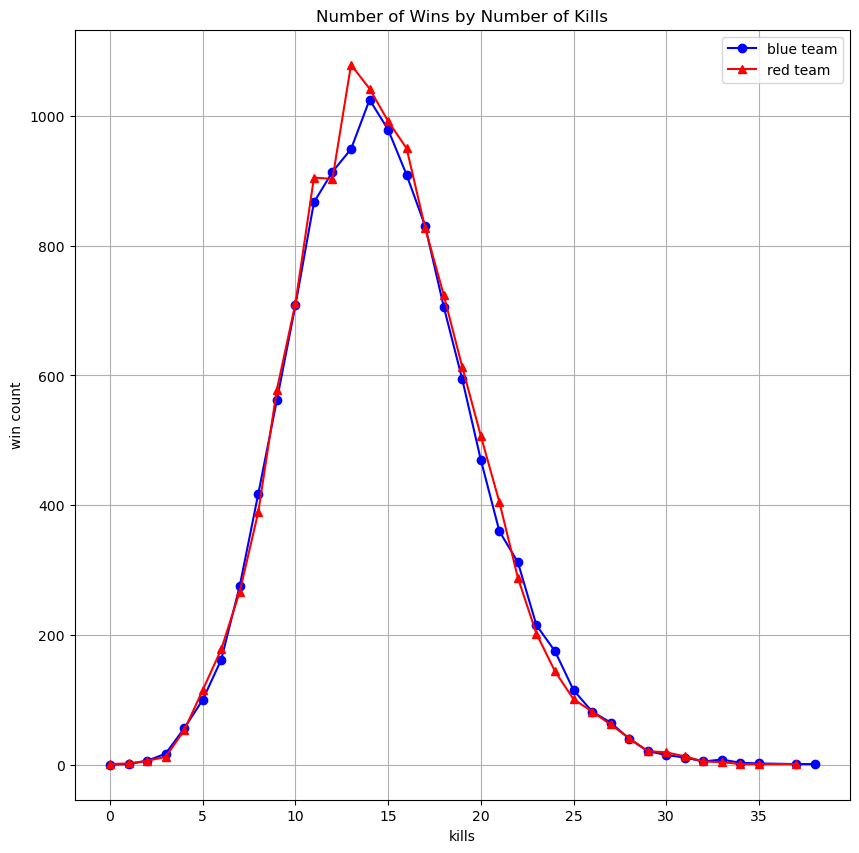

In [22]:
# 킬 수에 따른 승리 횟수 그래프

plt.figure(figsize=(10, 10))
plt.plot(blue_win_cnt['blueTeamTotalKills'], blue_win_cnt['blueWin'], marker='o', linestyle='-', color='b', label='blue team')
plt.plot(red_win_cnt['redTeamTotalKills'], red_win_cnt['redWin'], marker='^', linestyle='-', color='r', label='red team')
plt.title('Number of Wins by Number of Kills')
plt.xlabel('kills')
plt.ylabel('win count')
plt.legend()
plt.grid(True)
plt.show()

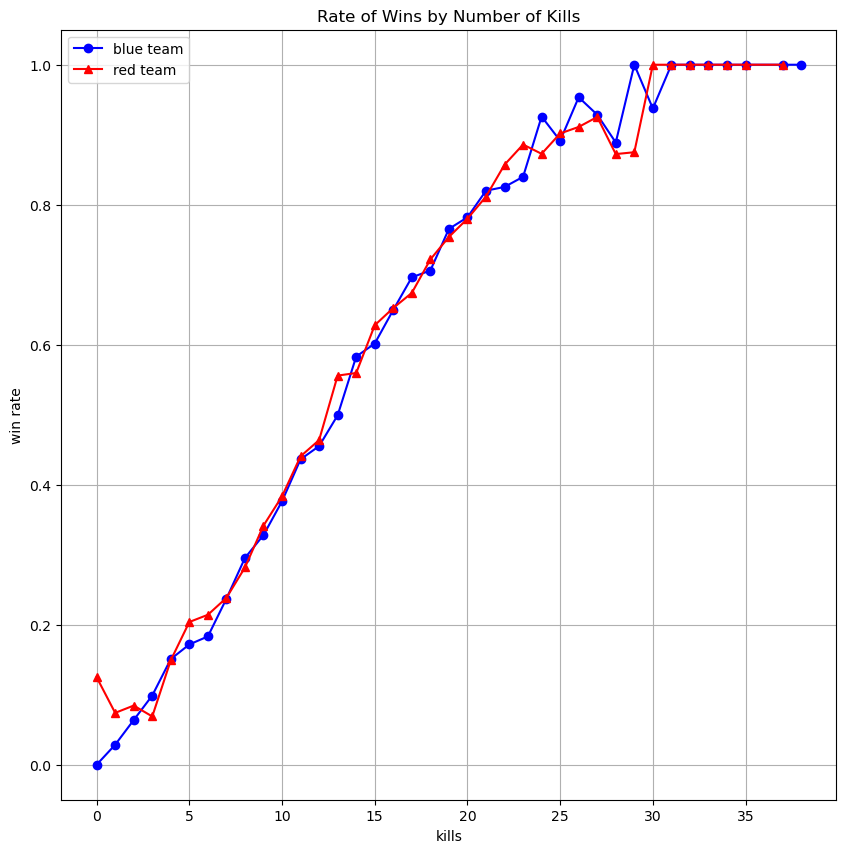

In [23]:
# 킬 수에 따른 승률 그래프

plt.figure(figsize=(10, 10))
plt.plot(blue_win_rate['blueTeamTotalKills'], blue_win_rate['blueWin'], marker='o', linestyle='-', color='b', label='blue team')
plt.plot(red_win_rate['redTeamTotalKills'], red_win_rate['redWin'], marker='^', linestyle='-', color='r', label='red team')
plt.title('Rate of Wins by Number of Kills')
plt.xlabel('kills')
plt.ylabel('win rate')
plt.grid(True)
plt.legend()
plt.show()

### 총 골드에 따른 승률확인
- 두 팀의 골드 획득량 차이에 따라 승률 확인
- 블루팀 골드에서 레드팀 골드를 뺀다 -> 양수=블루팀이 유리, 음수=레드팀 유리
- 블루팀 승리에 대해서 확인

In [24]:
# 두 팀의 골드 획득량 차이 컬럼 생성
df['goldGap'] = 0
df

,blueTeamControlWardsPlaced,blueTeamWardsPlaced,blueTeamTotalKills,blueTeamDragonKills,blueTeamHeraldKills,blueTeamTowersDestroyed,blueTeamInhibitorsDestroyed,blueTeamTurretPlatesDestroyed,blueTeamFirstBlood,blueTeamMinionsKilled,...,redTeamInhibitorsDestroyed,redTeamTurretPlatesDestroyed,redTeamMinionsKilled,redTeamJungleMinions,redTeamTotalGold,redTeamXp,redTeamTotalDamageToChamps,blueWin,redWin,goldGap
0,2,23,4,2,0,0,0,7,0,388,...,0,1,400,94,29637,32613,27239,1,0,0
1,2,46,12,1,0,1,0,10,0,348,...,0,4,373,76,28970,30320,36585,0,1,0
2,2,19,13,0,0,0,0,11,0,331,...,0,3,340,84,30510,29464,42984,0,1,0
3,3,28,8,0,1,1,0,9,1,355,...,0,5,378,87,25157,31069,28229,0,1,0
4,3,30,11,1,1,1,0,7,0,370,...,0,5,382,96,26052,29475,19245,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24220,0,27,1,1,0,0,0,5,0,282,...,0,0,370,102,26134,30760,22845,0,1,0
24221,4,29,5,0,0,0,0,4,0,323,...,0,2,365,80,25169,30857,29694,0,1,0
24222,1,25,16,1,1,1,0,11,0,300,...,0,4,342,81,30528,29566,36545,0,1,0
24223,4,27,15,0,0,1,0,9,0,364,...,0,2,341,74,31761,30573,42858,0,1,0


In [25]:
df['goldGap'] = df['blueTeamTotalGold'] - df['redTeamTotalGold']
df

,blueTeamControlWardsPlaced,blueTeamWardsPlaced,blueTeamTotalKills,blueTeamDragonKills,blueTeamHeraldKills,blueTeamTowersDestroyed,blueTeamInhibitorsDestroyed,blueTeamTurretPlatesDestroyed,blueTeamFirstBlood,blueTeamMinionsKilled,...,redTeamInhibitorsDestroyed,redTeamTurretPlatesDestroyed,redTeamMinionsKilled,redTeamJungleMinions,redTeamTotalGold,redTeamXp,redTeamTotalDamageToChamps,blueWin,redWin,goldGap
0,2,23,4,2,0,0,0,7,0,388,...,0,1,400,94,29637,32613,27239,1,0,-5714
1,2,46,12,1,0,1,0,10,0,348,...,0,4,373,76,28970,30320,36585,0,1,-1118
2,2,19,13,0,0,0,0,11,0,331,...,0,3,340,84,30510,29464,42984,0,1,-2384
3,3,28,8,0,1,1,0,9,1,355,...,0,5,378,87,25157,31069,28229,0,1,2176
4,3,30,11,1,1,1,0,7,0,370,...,0,5,382,96,26052,29475,19245,1,0,1720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24220,0,27,1,1,0,0,0,5,0,282,...,0,0,370,102,26134,30760,22845,0,1,-5764
24221,4,29,5,0,0,0,0,4,0,323,...,0,2,365,80,25169,30857,29694,0,1,-1831
24222,1,25,16,1,1,1,0,11,0,300,...,0,4,342,81,30528,29566,36545,0,1,-2663
24223,4,27,15,0,0,1,0,9,0,364,...,0,2,341,74,31761,30573,42858,0,1,-4526


In [26]:
goldgap_bluewin = df[['goldGap', 'blueWin']]
goldgap_bluewin

,goldGap,blueWin
0,-5714,1
1,-1118,0
2,-2384,0
3,2176,0
4,1720,1
...,...,...
24220,-5764,0
24221,-1831,0
24222,-2663,0
24223,-4526,0


In [27]:
tmp = pd.DataFrame(goldgap_bluewin.groupby(['goldGap'])['blueWin'].mean()).reset_index()
tmp

,goldGap,blueWin
0,-17787,0.0
1,-16997,0.0
2,-16879,0.0
3,-16846,0.0
4,-16335,0.0
...,...,...
12718,16627,1.0
12719,16764,1.0
12720,16948,1.0
12721,17081,1.0


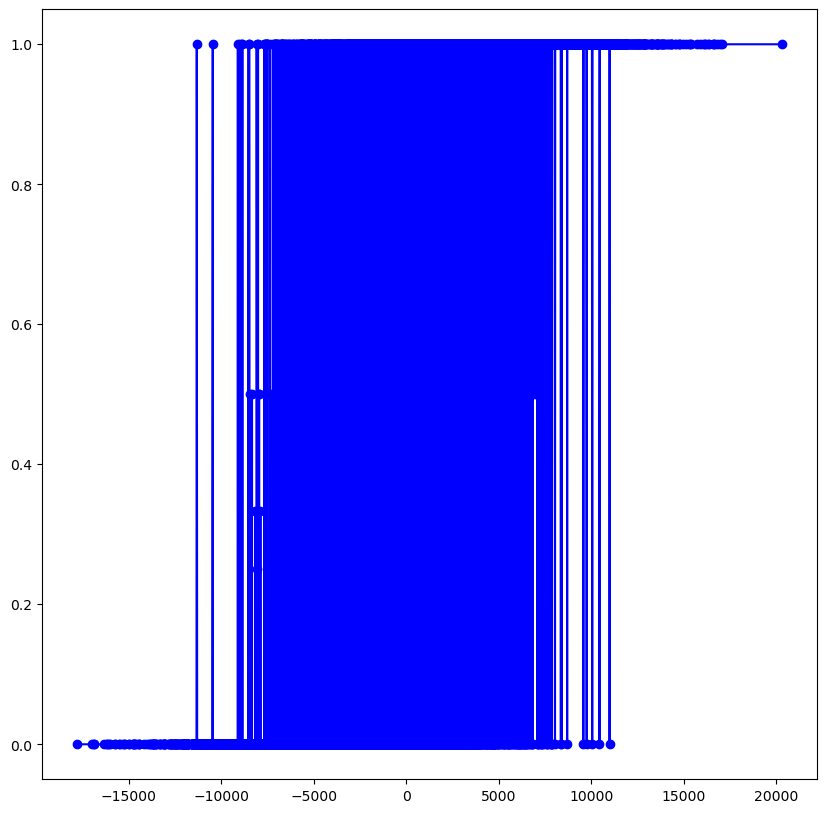

In [28]:
plt.figure(figsize=(10, 10))
plt.plot(tmp['goldGap'], tmp['blueWin'], marker='o', linestyle='-', color='b')
plt.show()

In [29]:
# blue, red가 승리할 때 골드 격차확인

tmp = pd.DataFrame(goldgap_bluewin.groupby(['blueWin'])['goldGap'].mean()).reset_index()
tmp

,blueWin,goldGap
0,0,-2384.793303
1,1,2524.513523


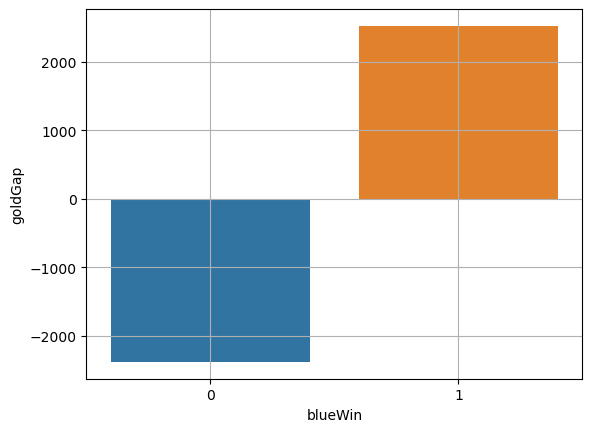

In [30]:
# 위에서 구한 값으로 그래프 생성

sns.barplot(data=tmp, x='blueWin', y='goldGap')
plt.grid(True)
plt.show()

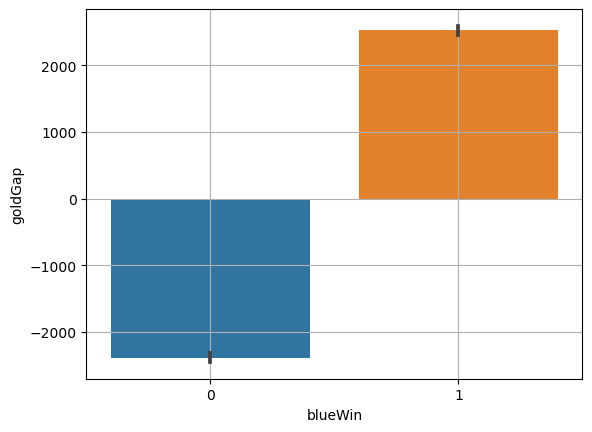

In [31]:
# df를 그대로 사용해서 구하기
# 신뢰구간 확인이 가능하다.
# 굳이 따로 groupby를 할 필요가 없어서 간단

sns.barplot(data=df, x='blueWin', y='goldGap')
plt.grid(True)
plt.show()

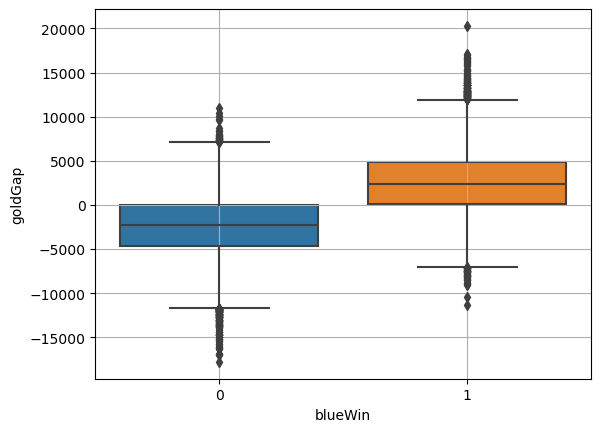

In [32]:
sns.boxplot(data=df, x='blueWin', y='goldGap')
plt.grid(True)

In [33]:
tmp = df[df['blueWin']==1]
tmp = tmp[tmp['goldGap']<0]

In [34]:
tmp

,blueTeamControlWardsPlaced,blueTeamWardsPlaced,blueTeamTotalKills,blueTeamDragonKills,blueTeamHeraldKills,blueTeamTowersDestroyed,blueTeamInhibitorsDestroyed,blueTeamTurretPlatesDestroyed,blueTeamFirstBlood,blueTeamMinionsKilled,...,redTeamInhibitorsDestroyed,redTeamTurretPlatesDestroyed,redTeamMinionsKilled,redTeamJungleMinions,redTeamTotalGold,redTeamXp,redTeamTotalDamageToChamps,blueWin,redWin,goldGap
0,2,23,4,2,0,0,0,7,0,388,...,0,1,400,94,29637,32613,27239,1,0,-5714
6,3,22,15,2,0,1,0,10,0,331,...,0,5,403,96,28584,29831,31563,1,0,-867
47,0,78,14,1,0,0,0,7,0,320,...,0,2,359,74,27682,29944,33949,1,0,-65
50,0,28,14,0,0,1,0,12,1,393,...,0,9,302,74,30630,28913,42849,1,0,-166
51,5,27,12,1,1,0,0,8,1,389,...,0,2,384,106,26876,29744,29125,1,0,-139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24191,3,23,6,1,0,0,0,5,1,308,...,0,2,324,80,25886,28390,23110,1,0,-1855
24194,6,31,8,1,0,0,0,6,0,326,...,0,1,364,72,25642,29918,28109,1,0,-2169
24211,3,28,10,1,0,0,0,8,0,349,...,0,2,357,112,27212,29817,21307,1,0,-1374
24216,7,30,11,0,0,1,0,8,0,296,...,0,3,352,80,27146,29031,31116,1,0,-346


In [35]:
tmp.sort_values('goldGap', ascending=True)

,blueTeamControlWardsPlaced,blueTeamWardsPlaced,blueTeamTotalKills,blueTeamDragonKills,blueTeamHeraldKills,blueTeamTowersDestroyed,blueTeamInhibitorsDestroyed,blueTeamTurretPlatesDestroyed,blueTeamFirstBlood,blueTeamMinionsKilled,...,redTeamInhibitorsDestroyed,redTeamTurretPlatesDestroyed,redTeamMinionsKilled,redTeamJungleMinions,redTeamTotalGold,redTeamXp,redTeamTotalDamageToChamps,blueWin,redWin,goldGap
9061,0,25,8,0,0,0,0,13,0,292,...,0,0,323,92,35070,32229,47699,1,0,-11320
15397,1,13,12,0,0,1,0,15,0,280,...,0,4,369,96,34658,33913,46145,1,0,-10456
9712,5,25,6,0,0,0,0,12,0,321,...,0,4,347,96,33710,31069,42010,1,0,-9100
5893,3,32,14,0,0,0,0,15,1,301,...,0,0,376,127,35867,34465,45404,1,0,-8966
820,2,31,11,0,0,0,0,15,1,316,...,0,0,375,92,34497,31118,40064,1,0,-8863
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3639,1,79,12,2,0,0,0,10,1,330,...,0,4,384,95,25915,29810,26977,1,0,-7
12063,5,39,13,1,0,0,0,7,1,374,...,0,9,356,70,28976,29450,32647,1,0,-4
6501,1,142,20,1,0,0,0,7,1,291,...,0,2,289,85,29143,28421,30852,1,0,-4
9337,2,23,7,2,0,1,0,5,0,405,...,0,3,342,98,26373,29511,32393,1,0,-2


In [43]:
# blue팀, red팀 승을 나누지 않고 하나로 처리 -> blue팀 승리:1, redteam승리: -1

df['Win'] = 0.0
df['Win'] = (df['blueWin'] - 0.5) // 0.5
df

,blueTeamControlWardsPlaced,blueTeamWardsPlaced,blueTeamTotalKills,blueTeamDragonKills,blueTeamHeraldKills,blueTeamTowersDestroyed,blueTeamInhibitorsDestroyed,blueTeamTurretPlatesDestroyed,blueTeamFirstBlood,blueTeamMinionsKilled,...,redTeamTurretPlatesDestroyed,redTeamMinionsKilled,redTeamJungleMinions,redTeamTotalGold,redTeamXp,redTeamTotalDamageToChamps,blueWin,redWin,goldGap,Win
0,2,23,4,2,0,0,0,7,0,388,...,1,400,94,29637,32613,27239,1,0,-5714,1.0
1,2,46,12,1,0,1,0,10,0,348,...,4,373,76,28970,30320,36585,0,1,-1118,-1.0
2,2,19,13,0,0,0,0,11,0,331,...,3,340,84,30510,29464,42984,0,1,-2384,-1.0
3,3,28,8,0,1,1,0,9,1,355,...,5,378,87,25157,31069,28229,0,1,2176,-1.0
4,3,30,11,1,1,1,0,7,0,370,...,5,382,96,26052,29475,19245,1,0,1720,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24220,0,27,1,1,0,0,0,5,0,282,...,0,370,102,26134,30760,22845,0,1,-5764,-1.0
24221,4,29,5,0,0,0,0,4,0,323,...,2,365,80,25169,30857,29694,0,1,-1831,-1.0
24222,1,25,16,1,1,1,0,11,0,300,...,4,342,81,30528,29566,36545,0,1,-2663,-1.0
24223,4,27,15,0,0,1,0,9,0,364,...,2,341,74,31761,30573,42858,0,1,-4526,-1.0


In [52]:
win_df = df['Win']
windf = pd.DataFrame(win_df)
windf

,Win
0,1.0
1,-1.0
2,-1.0
3,-1.0
4,1.0
...,...
24220,-1.0
24221,-1.0
24222,-1.0
24223,-1.0


# 공분산 확인

In [59]:
# 숫자형 열만 선택
# 1. select_dtype()을 통해 특정 데이터타입을 가지는 열을 가져온다.
# 2. 데이터 타입을 알고있고 한, 두 개의 열만 삭제하면 되는 경우 drop()함수 사용

numeric_columns = df.select_dtypes(include=['int64', 'float64'])
numeric_columns

31

In [61]:
corr_matrix = numeric_columns.corr()
corr_matrix

,blueTeamControlWardsPlaced,blueTeamWardsPlaced,blueTeamTotalKills,blueTeamDragonKills,blueTeamHeraldKills,blueTeamTowersDestroyed,blueTeamInhibitorsDestroyed,blueTeamTurretPlatesDestroyed,blueTeamFirstBlood,blueTeamMinionsKilled,...,redTeamTurretPlatesDestroyed,redTeamMinionsKilled,redTeamJungleMinions,redTeamTotalGold,redTeamXp,redTeamTotalDamageToChamps,blueWin,redWin,goldGap,Win
blueTeamControlWardsPlaced,1.000000,0.047376,0.068543,0.069193,0.034051,0.020096,-0.020764,-0.072677,0.049997,0.077627,...,0.026004,0.028775,-0.024080,-0.091578,-0.078738,-0.093242,0.060471,-0.060471,0.099838,0.060471
blueTeamWardsPlaced,0.047376,1.000000,0.011290,0.025946,0.008627,0.033254,0.006148,-0.018700,0.008999,-0.009352,...,0.035543,-0.018945,-0.022633,-0.023142,-0.024806,-0.012098,0.006818,-0.006818,0.022803,0.006818
blueTeamTotalKills,0.068543,0.011290,1.000000,0.262090,0.097800,0.417658,0.058298,-0.108014,0.227806,-0.009294,...,0.429572,-0.490522,-0.304913,-0.177917,-0.484295,0.081897,0.392896,-0.392896,0.667023,0.392896
blueTeamDragonKills,0.069193,0.025946,0.262090,1.000000,0.061973,0.193574,0.025198,-0.139336,0.136974,0.130007,...,0.192154,-0.152316,-0.138013,-0.282733,-0.272304,-0.200551,0.317602,-0.317602,0.348625,0.317602
blueTeamHeraldKills,0.034051,0.008627,0.097800,0.061973,1.000000,0.117946,0.009140,-0.081997,0.050264,0.089643,...,0.116044,-0.042750,-0.037345,-0.144764,-0.133093,-0.137563,0.108177,-0.108177,0.185230,0.108177
blueTeamTowersDestroyed,0.020096,0.033254,0.417658,0.193574,0.117946,1.000000,0.227351,-0.173006,0.170791,0.262918,...,0.653255,-0.359686,-0.201580,-0.332350,-0.415466,-0.212307,0.316028,-0.316028,0.595761,0.316028
blueTeamInhibitorsDestroyed,-0.020764,0.006148,0.058298,0.025198,0.009140,0.227351,1.000000,-0.034855,0.027944,0.030756,...,0.089135,-0.091177,-0.066998,-0.084180,-0.122743,-0.066711,0.037800,-0.037800,0.109781,0.037800
blueTeamTurretPlatesDestroyed,-0.072677,-0.018700,-0.108014,-0.139336,-0.081997,-0.173006,-0.034855,1.000000,-0.149979,-0.347522,...,-0.276218,0.194622,0.147677,0.583480,0.339055,0.363578,-0.261331,0.261331,-0.475483,-0.261331
blueTeamFirstBlood,0.049997,0.008999,0.227806,0.136974,0.050264,0.170791,0.027944,-0.149979,1.000000,0.119104,...,0.181539,-0.135211,-0.080294,-0.258254,-0.190034,-0.157814,0.173681,-0.173681,0.318424,0.173681
blueTeamMinionsKilled,0.077627,-0.009352,-0.009294,0.130007,0.089643,0.262918,0.030756,-0.347522,0.119104,1.000000,...,0.275858,0.076497,0.005047,-0.443385,-0.145760,-0.463285,0.247761,-0.247761,0.454718,0.247761


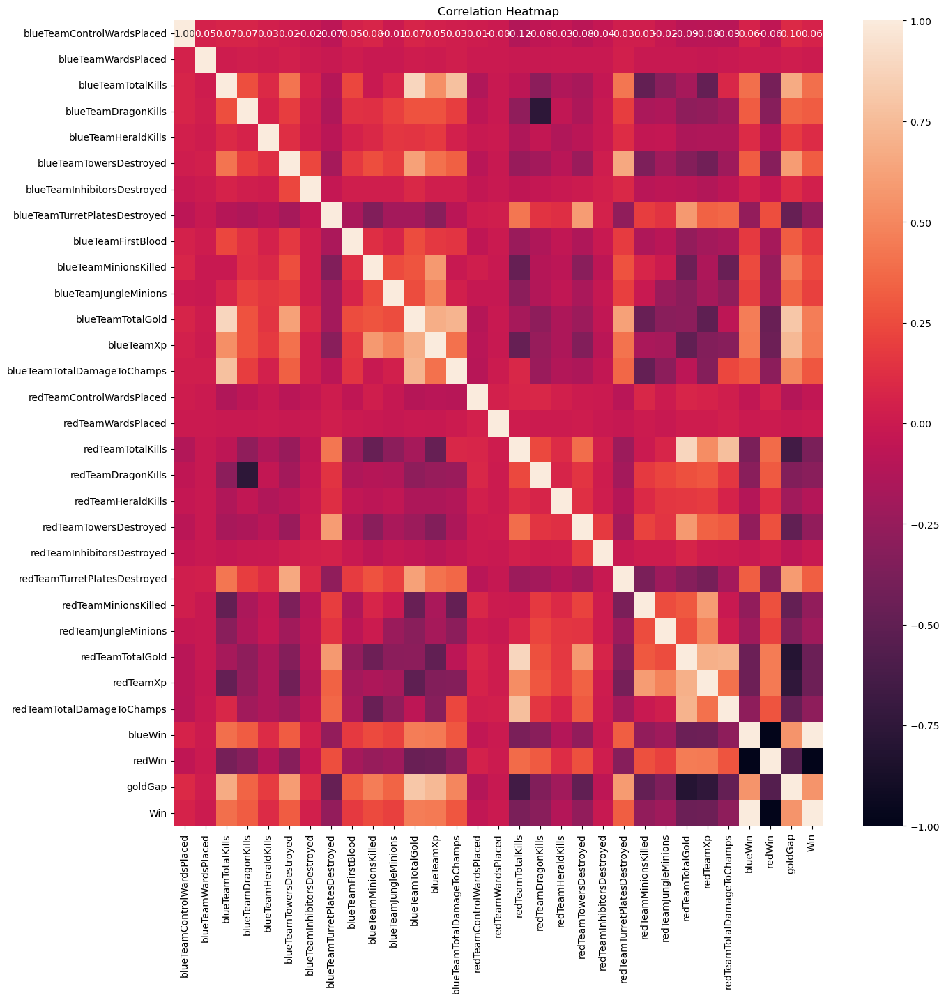

In [64]:
# heatmap을 통해 상과관계가 큰 변수를 확인할 수 있다.
# 우선 제거하지 않고 모델 만들고 상관계수 확인 및 제거 후 성능 비교

plt.figure(figsize=(15, 15))
sns.heatmap(corr_matrix, annot=True, fmt='0.2f')
plt.title('Correlation Heatmap')
plt.show()

In [65]:
sns.pairplot(numeric_columns)
plt.show()

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

# 회귀 모델 생성

## 선형회귀모델
- 현재 데이터는 1, -1을 예측하는 것이라 선형회귀는 맞지 않지만 일단 만들어본다.

In [54]:
df_cols = df.columns
df_cols

Index(['blueTeamControlWardsPlaced', 'blueTeamWardsPlaced',
       'blueTeamTotalKills', 'blueTeamDragonKills', 'blueTeamHeraldKills',
       'blueTeamTowersDestroyed', 'blueTeamInhibitorsDestroyed',
       'blueTeamTurretPlatesDestroyed', 'blueTeamFirstBlood',
       'blueTeamMinionsKilled', 'blueTeamJungleMinions', 'blueTeamTotalGold',
       'blueTeamXp', 'blueTeamTotalDamageToChamps',
       'redTeamControlWardsPlaced', 'redTeamWardsPlaced', 'redTeamTotalKills',
       'redTeamDragonKills', 'redTeamHeraldKills', 'redTeamTowersDestroyed',
       'redTeamInhibitorsDestroyed', 'redTeamTurretPlatesDestroyed',
       'redTeamMinionsKilled', 'redTeamJungleMinions', 'redTeamTotalGold',
       'redTeamXp', 'redTeamTotalDamageToChamps', 'blueWin', 'redWin',
       'goldGap', 'Win'],
      dtype='object')

In [56]:
new_df = df.drop(['blueWin', 'redWin'], axis=1)
new_df

,blueTeamControlWardsPlaced,blueTeamWardsPlaced,blueTeamTotalKills,blueTeamDragonKills,blueTeamHeraldKills,blueTeamTowersDestroyed,blueTeamInhibitorsDestroyed,blueTeamTurretPlatesDestroyed,blueTeamFirstBlood,blueTeamMinionsKilled,...,redTeamTowersDestroyed,redTeamInhibitorsDestroyed,redTeamTurretPlatesDestroyed,redTeamMinionsKilled,redTeamJungleMinions,redTeamTotalGold,redTeamXp,redTeamTotalDamageToChamps,goldGap,Win
0,2,23,4,2,0,0,0,7,0,388,...,2,0,1,400,94,29637,32613,27239,-5714,1.0
1,2,46,12,1,0,1,0,10,0,348,...,1,0,4,373,76,28970,30320,36585,-1118,-1.0
2,2,19,13,0,0,0,0,11,0,331,...,2,0,3,340,84,30510,29464,42984,-2384,-1.0
3,3,28,8,0,1,1,0,9,1,355,...,0,0,5,378,87,25157,31069,28229,2176,-1.0
4,3,30,11,1,1,1,0,7,0,370,...,1,0,5,382,96,26052,29475,19245,1720,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24220,0,27,1,1,0,0,0,5,0,282,...,0,0,0,370,102,26134,30760,22845,-5764,-1.0
24221,4,29,5,0,0,0,0,4,0,323,...,1,0,2,365,80,25169,30857,29694,-1831,-1.0
24222,1,25,16,1,1,1,0,11,0,300,...,1,0,4,342,81,30528,29566,36545,-2663,-1.0
24223,4,27,15,0,0,1,0,9,0,364,...,2,0,2,341,74,31761,30573,42858,-4526,-1.0


In [66]:
import os
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt

In [69]:
data = df.drop(['blueWin', 'redWin', 'Win'], axis = 1)
data

,blueTeamControlWardsPlaced,blueTeamWardsPlaced,blueTeamTotalKills,blueTeamDragonKills,blueTeamHeraldKills,blueTeamTowersDestroyed,blueTeamInhibitorsDestroyed,blueTeamTurretPlatesDestroyed,blueTeamFirstBlood,blueTeamMinionsKilled,...,redTeamHeraldKills,redTeamTowersDestroyed,redTeamInhibitorsDestroyed,redTeamTurretPlatesDestroyed,redTeamMinionsKilled,redTeamJungleMinions,redTeamTotalGold,redTeamXp,redTeamTotalDamageToChamps,goldGap
0,2,23,4,2,0,0,0,7,0,388,...,0,2,0,1,400,94,29637,32613,27239,-5714
1,2,46,12,1,0,1,0,10,0,348,...,0,1,0,4,373,76,28970,30320,36585,-1118
2,2,19,13,0,0,0,0,11,0,331,...,0,2,0,3,340,84,30510,29464,42984,-2384
3,3,28,8,0,1,1,0,9,1,355,...,0,0,0,5,378,87,25157,31069,28229,2176
4,3,30,11,1,1,1,0,7,0,370,...,0,1,0,5,382,96,26052,29475,19245,1720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24220,0,27,1,1,0,0,0,5,0,282,...,0,0,0,0,370,102,26134,30760,22845,-5764
24221,4,29,5,0,0,0,0,4,0,323,...,0,1,0,2,365,80,25169,30857,29694,-1831
24222,1,25,16,1,1,1,0,11,0,300,...,0,1,0,4,342,81,30528,29566,36545,-2663
24223,4,27,15,0,0,1,0,9,0,364,...,0,2,0,2,341,74,31761,30573,42858,-4526


In [72]:
# target을 불러올 때 df['Win']으로 하면 Series형태가 된다. -> df[['Win']]처럼 중괄호를 하나 더 붙여줘서 DataFrame형태가 될 수 있게 한다.
target = df[['Win']]
target

,Win
0,1.0
1,-1.0
2,-1.0
3,-1.0
4,1.0
...,...
24220,-1.0
24221,-1.0
24222,-1.0
24223,-1.0


In [73]:
x_data1 = sm.add_constant(data, has_constant='add') # 상수항 추가

In [97]:
# 모델 생성 및 적합 후 모델 정보 확인
# R-squared : x에 의해 설명되는 y의 총 변동성 -> 현재 0.341으로 매우 낮다.
# P값 : 다중공선성 -> 높으면 다른 변수에 의해 설명된다는 의미 -> 높은 변수는 제거

model = sm.OLS(target, x_data1)
fitted_model = model.fit()
print(fitted_model.summary())

                            OLS Regression Results                            
Dep. Variable:                    Win   R-squared:                       0.341
Model:                            OLS   Adj. R-squared:                  0.340
Method:                 Least Squares   F-statistic:                     463.5
Date:                Sun, 28 Apr 2024   Prob (F-statistic):               0.00
Time:                        11:02:40   Log-Likelihood:                -29323.
No. Observations:               24225   AIC:                         5.870e+04
Df Residuals:                   24197   BIC:                         5.893e+04
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         

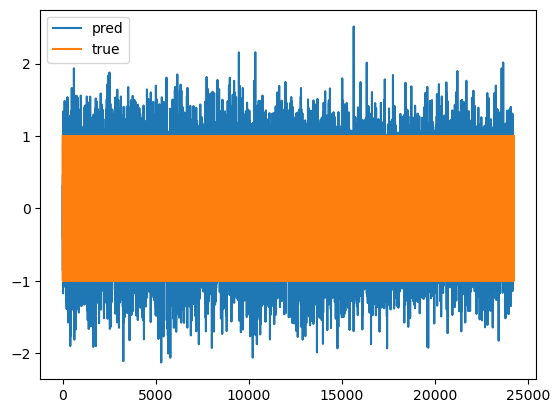

In [102]:
plt.plot(np.array(fitted_model.predict(x_data1)), label='pred')
plt.plot(np.array(target), label='true')
plt.legend()
plt.show()

In [108]:
# 다중공선성이 큰 변수 제거
# blueTeamControlWardsPlaced, blueTeamHeraldKills, blueTeamFirstBlood, redTeamMinionsKilled, 
x_data2 = x_data1.drop(['blueTeamControlWardsPlaced', 'blueTeamHeraldKills', 'blueTeamFirstBlood', 'redTeamMinionsKilled', 'blueTeamJungleMinions'], axis=1)
x_data2

,const,blueTeamWardsPlaced,blueTeamTotalKills,blueTeamDragonKills,blueTeamTowersDestroyed,blueTeamInhibitorsDestroyed,blueTeamTurretPlatesDestroyed,blueTeamMinionsKilled,blueTeamTotalGold,blueTeamXp,...,redTeamDragonKills,redTeamHeraldKills,redTeamTowersDestroyed,redTeamInhibitorsDestroyed,redTeamTurretPlatesDestroyed,redTeamJungleMinions,redTeamTotalGold,redTeamXp,redTeamTotalDamageToChamps,goldGap
0,1.0,23,4,2,0,0,7,388,23923,29798,...,0,0,2,0,1,94,29637,32613,27239,-5714
1,1.0,46,12,1,1,0,10,348,27852,30530,...,0,0,1,0,4,76,28970,30320,36585,-1118
2,1.0,19,13,0,0,0,11,331,28126,29501,...,1,0,2,0,3,84,30510,29464,42984,-2384
3,1.0,28,8,0,1,0,9,355,27333,30466,...,1,0,0,0,5,87,25157,31069,28229,2176
4,1.0,30,11,1,1,0,7,370,27772,31066,...,1,0,1,0,5,96,26052,29475,19245,1720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24220,1.0,27,1,1,0,0,5,282,20370,24223,...,1,0,0,0,0,102,26134,30760,22845,-5764
24221,1.0,29,5,0,0,0,4,323,23338,28711,...,1,0,1,0,2,80,25169,30857,29694,-1831
24222,1.0,25,16,1,1,0,11,300,27865,28546,...,1,0,1,0,4,81,30528,29566,36545,-2663
24223,1.0,27,15,0,1,0,9,364,27235,28762,...,2,0,2,0,2,74,31761,30573,42858,-4526


In [109]:
# 모델 생성 및 적합 후 모델 정보 확인
# R-squared : x에 의해 설명되는 y의 총 변동성 -> 현재 0.341으로 매우 낮다.
# P값 : 다중공선성 -> 높으면 다른 변수에 의해 설명된다는 의미 -> 높은 변수는 제거

model = sm.OLS(target, x_data2)
fitted_model = model.fit()
print(fitted_model.summary())

                            OLS Regression Results                            
Dep. Variable:                    Win   R-squared:                       0.341
Model:                            OLS   Adj. R-squared:                  0.340
Method:                 Least Squares   F-statistic:                     569.0
Date:                Sun, 28 Apr 2024   Prob (F-statistic):               0.00
Time:                        11:10:57   Log-Likelihood:                -29323.
No. Observations:               24225   AIC:                         5.869e+04
Df Residuals:                   24202   BIC:                         5.888e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         

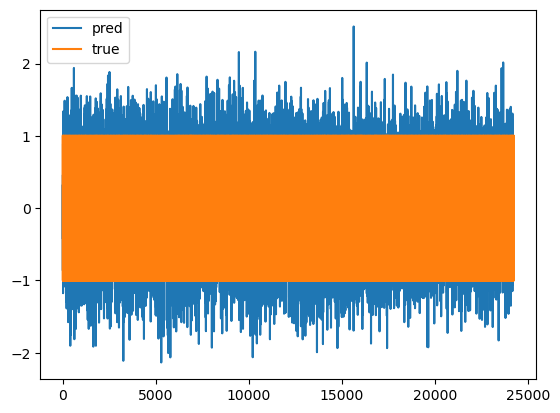

In [110]:
plt.plot(np.array(fitted_model.predict(x_data2)), label='pred')
plt.plot(np.array(target), label='true')
plt.legend()
plt.show()

## logistic regression
- 결과 데이터의 class가 2개일 때 예측하는 모델
- logistic 함수를 사용한다. -> sigmoid: 0 or 1으로 결과를 구분해줌
- https://youtu.be/TLCakPDj7e8?si=JL-dOKCzdV6UAC7y 참고

In [111]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, accuracy_score, confusion_matrix, recall_score, precision_score

In [113]:
x_data = df.drop(['redWin', 'Win'], axis=1)
x_data

,blueTeamControlWardsPlaced,blueTeamWardsPlaced,blueTeamTotalKills,blueTeamDragonKills,blueTeamHeraldKills,blueTeamTowersDestroyed,blueTeamInhibitorsDestroyed,blueTeamTurretPlatesDestroyed,blueTeamFirstBlood,blueTeamMinionsKilled,...,redTeamTowersDestroyed,redTeamInhibitorsDestroyed,redTeamTurretPlatesDestroyed,redTeamMinionsKilled,redTeamJungleMinions,redTeamTotalGold,redTeamXp,redTeamTotalDamageToChamps,blueWin,goldGap
0,2,23,4,2,0,0,0,7,0,388,...,2,0,1,400,94,29637,32613,27239,1,-5714
1,2,46,12,1,0,1,0,10,0,348,...,1,0,4,373,76,28970,30320,36585,0,-1118
2,2,19,13,0,0,0,0,11,0,331,...,2,0,3,340,84,30510,29464,42984,0,-2384
3,3,28,8,0,1,1,0,9,1,355,...,0,0,5,378,87,25157,31069,28229,0,2176
4,3,30,11,1,1,1,0,7,0,370,...,1,0,5,382,96,26052,29475,19245,1,1720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24220,0,27,1,1,0,0,0,5,0,282,...,0,0,0,370,102,26134,30760,22845,0,-5764
24221,4,29,5,0,0,0,0,4,0,323,...,1,0,2,365,80,25169,30857,29694,0,-1831
24222,1,25,16,1,1,1,0,11,0,300,...,1,0,4,342,81,30528,29566,36545,0,-2663
24223,4,27,15,0,0,1,0,9,0,364,...,2,0,2,341,74,31761,30573,42858,0,-4526


In [115]:
target = df[['blueWin']]
target

,blueWin
0,1
1,0
2,0
3,0
4,1
...,...
24220,0
24221,0
24222,0
24223,0


In [118]:
X_train, X_test, y_train, y_test = train_test_split(x_data, target, test_size=0.3, random_state=2021)

In [119]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(16957, 29)
(7268, 29)
(16957, 1)
(7268, 1)


In [120]:
X_train

,blueTeamControlWardsPlaced,blueTeamWardsPlaced,blueTeamTotalKills,blueTeamDragonKills,blueTeamHeraldKills,blueTeamTowersDestroyed,blueTeamInhibitorsDestroyed,blueTeamTurretPlatesDestroyed,blueTeamFirstBlood,blueTeamMinionsKilled,...,redTeamTowersDestroyed,redTeamInhibitorsDestroyed,redTeamTurretPlatesDestroyed,redTeamMinionsKilled,redTeamJungleMinions,redTeamTotalGold,redTeamXp,redTeamTotalDamageToChamps,blueWin,goldGap
20936,4,26,18,2,0,0,0,3,0,360,...,1,0,4,355,102,24374,29446,18513,1,4981
8443,4,24,13,0,0,0,0,11,0,332,...,2,0,4,303,80,32074,28363,38252,1,-2725
12232,5,32,9,1,0,0,0,7,0,318,...,1,0,4,324,91,28822,30287,35370,0,-3977
11385,3,243,13,1,0,0,0,13,1,357,...,1,0,2,443,81,30631,30900,29476,0,-1934
8308,1,22,10,1,0,2,0,10,0,347,...,0,0,6,380,80,27336,29121,31257,1,1268
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22486,1,136,7,1,0,0,0,9,0,314,...,2,0,4,359,92,32778,31429,37080,0,-8883
20318,3,23,20,0,0,0,0,7,1,339,...,1,0,5,303,78,26334,26955,32038,1,4559
2669,8,32,13,1,0,0,0,11,0,388,...,1,0,4,333,63,23953,27132,33833,1,4960
17536,1,24,8,0,0,0,0,7,1,314,...,2,0,1,330,85,28653,29197,37749,0,-4763


In [121]:
y_train

,blueWin
20936,1
8443,1
12232,0
11385,0
8308,1
...,...
22486,0
20318,1
2669,1
17536,0


In [125]:
# 모델 생성

model = LogisticRegression()
fitted_model = model.fit(X_train, y_train)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [136]:
# 각 변수의 beta 확인
fitted_model.coef_

array([[ 3.73756932e-05, -1.20599039e-03,  6.76270267e-04,
         1.14053354e-03, -4.30800364e-05, -1.01969971e-05,
         1.18245239e-06,  2.61262432e-04,  6.44921015e-06,
        -4.11026976e-03,  6.61942558e-04,  1.00514858e-04,
         2.00595767e-04,  1.25204894e-05,  2.34425076e-04,
         1.39125068e-04, -5.59139867e-04, -1.07790109e-03,
         5.78049291e-06, -5.11425508e-05, -4.04547049e-07,
         1.50910406e-04,  1.85544923e-03, -8.27600379e-04,
        -8.03902154e-05, -1.80005980e-04, -2.39687238e-05,
         4.55118330e-03,  1.80905073e-04]])

In [159]:
# 예측 실시 -> y=0일 확률, y=1일 확률

P = model.predict_proba(X_test)[:, 1]
P

array([0.55751552, 0.91477039, 0.81616214, ..., 0.62761042, 0.7136131 ,
       0.22919108])

In [160]:
beta = np.concatenate([model.intercept_, model.coef_.reshape(-1)]).round(2)
Xbeta = np.matmul(np.c_[np.ones(X_test.shape[0]), X_test], beta.reshape(-1, 1))

P_1 = 1 / (1 + np.exp(-Xbeta))

pd.DataFrame(np.concatenate([P_1, model.predict_proba(X_test)[:, 1].reshape(-1, 1)], axis=1),columns=['직접', '패키지'])

,직접,패키지
0,0.5,0.557516
1,0.5,0.914770
2,0.5,0.816162
3,0.5,0.718036
4,0.5,0.253717
...,...,...
7263,0.5,0.311293
7264,0.5,0.194948
7265,0.5,0.627610
7266,0.5,0.713613


In [201]:
# 정확도 확인하기

Cut_off = np.linspace(0.5, 0.99, 15)

p = pd.DataFrame(P)
p.columns = ['blueWin']
y_test = y_test.reset_index().drop('index', axis=1)



for cutoff in Cut_off:
    y_pred = p[p['blueWin'] >= cutoff]
    print(1)
    idx_li = y_pred.index.tolist()
    print(1)
    y_test_tmp = y_test.loc[idx_li]
    print(1)
    acc = accuracy_score(y_true=y_test_tmp, y_pred=y_pred)
    recall = recall_score(y_true=y_test_tmp, y_pred=y_pred)
    precision = precision_score(y_true=y_test_tmp, y_pred=y_pred)
    
    print(f'cut off: {cutoff:0.2f}, 정확도: {acc:0.2f}, 민감도: {recall:0.2f}, 정밀도: {precision:0.2f}')

1
1
1


ValueError: Classification metrics can't handle a mix of binary and continuous targets

In [ ]:


for cutoff in Cut_off:
    y_pred = p[p['predict_pct'] >= cutoff]
    acc = accuracy_score(y_true=y_test, y_pred=y_pred)
    recall = recall_score(y_true=y_test, y_pred=y_pred)
    precision = precision_score(y_true=y_test, y_pred=y_pred)
    
    print(f'cut off: {cutoff:0.2f}, 정확도: {acc:0.2f}, 민감도: {recall:0.2f}, 정밀도: {precision:0.2f}')

In [174]:
Cut_off = np.linspace(0.5, 0.99, 10)

p = pd.DataFrame(P)
p.columns = ['predict_pct']
y_test = y_test.reset_index().drop('index', axis=1)

for cutoff in Cut_off:
    y_pred = p[p['predict_pct'] >= cutoff]
    

0.5
      predict_pct
0        0.557516
1        0.914770
2        0.816162
3        0.718036
5        0.838579
...           ...
7257     0.554017
7260     0.641996
7261     0.776921
7265     0.627610
7266     0.713613

[3588 rows x 1 columns]
0.5544444444444444
      predict_pct
0        0.557516
1        0.914770
2        0.816162
3        0.718036
5        0.838579
...           ...
7254     0.720985
7260     0.641996
7261     0.776921
7265     0.627610
7266     0.713613

[3222 rows x 1 columns]
0.6088888888888889
      predict_pct
1        0.914770
2        0.816162
3        0.718036
5        0.838579
6        0.668990
...           ...
7254     0.720985
7260     0.641996
7261     0.776921
7265     0.627610
7266     0.713613

[2870 rows x 1 columns]
0.6633333333333333
      predict_pct
1        0.914770
2        0.816162
3        0.718036
5        0.838579
6        0.668990
...           ...
7250     0.852870
7251     0.966219
7254     0.720985
7261     0.776921
7266     0.713613


In [179]:
y_test.reset_index().drop('index', axis=1)

,blueWin
0,0
1,1
2,1
3,1
4,1
...,...
7263,0
7264,0
7265,1
7266,0


In [180]:
p

,predict_pct
0,0.557516
1,0.914770
2,0.816162
3,0.718036
4,0.253717
...,...
7263,0.311293
7264,0.194948
7265,0.627610
7266,0.713613
